# Image Classification for Brain Diseases from Scott Sun


In [27]:
# Importing libraries and packages:

import numpy as np
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import glob
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import AdaBoostClassifier
import xgboost
from xgboost import XGBClassifier
from sklearn.preprocessing import scale
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


%matplotlib inline

# Test the load image and show image function 

In [2]:
image = mpimg.imread(r'C:\Users\john17\Documents\school\4662\MRI64\Abscesso_img_1_64x64.jpeg')
image.shape

(64, 64, 3)

In [3]:
image

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

# Convert RGB images to Grayscale images

In [4]:
from skimage.color import rgb2gray
image_gray = rgb2gray(image)

In [5]:
image_gray.shape


(64, 64)

In [6]:
image_gray

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

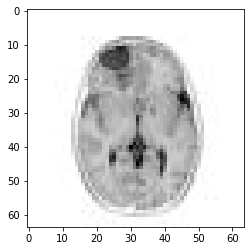

In [7]:
%matplotlib inline 
plt.imshow(image_gray, cmap=plt.cm.gray_r, interpolation='nearest')

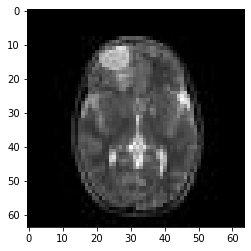

In [8]:
%matplotlib inline 
plt.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')

# Read images from file fold to Dataframe

In [9]:

filenames = glob.glob(r'C:\Users\john17\Documents\school\4662\MRI64\*.jpeg')


print(filenames)

['C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_100_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_101_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_102_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_103_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_104_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_105_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_106_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_107_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_108_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_109_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_10_64x64.jpeg', 'C:\\Users\\john17\\Documents\\school\\4662\\MRI64\\Abscesso_img_110_64x64.jpeg', 'C:\\Users\\john

In [10]:
newlist = []
for file in filenames:
    print(file)
    #load the single file
    image_file = mpimg.imread(file)
    image_2d = rgb2gray(image_file)
    print(image_2d)
    #flat the matrix into a 1D array
    flat_matrix = image_2d.flatten()
    newlist.append(flat_matrix)

print(newlist)   

C:\Users\john17\Documents\school\4662\MRI64\Abscesso_img_100_64x64.jpeg
[[0.05098039 0.05098039 0.05098039 ... 0.05490196 0.05490196 0.05490196]
 [0.05490196 0.05490196 0.05490196 ... 0.05490196 0.05490196 0.05490196]
 [0.05490196 0.05490196 0.05490196 ... 0.05490196 0.05490196 0.05490196]
 ...
 [0.05882353 0.0627451  0.03921569 ... 0.05098039 0.05098039 0.05098039]
 [0.05882353 0.05098039 0.05490196 ... 0.05098039 0.05098039 0.05098039]
 [0.05490196 0.04705882 0.07058824 ... 0.05098039 0.05098039 0.05098039]]
C:\Users\john17\Documents\school\4662\MRI64\Abscesso_img_101_64x64.jpeg
[[0.05490196 0.05490196 0.05490196 ... 0.05098039 0.05098039 0.05098039]
 [0.05098039 0.05098039 0.05098039 ... 0.05098039 0.05098039 0.05098039]
 [0.04705882 0.04705882 0.04705882 ... 0.05098039 0.05098039 0.05098039]
 ...
 [0.04705882 0.04705882 0.04705882 ... 0.05098039 0.05098039 0.05098039]
 [0.04705882 0.04705882 0.04705882 ... 0.05098039 0.05098039 0.05098039]
 [0.04705882 0.04705882 0.04705882 ... 0.0

In [11]:
#create the data frame for image 
X = pd.DataFrame(newlist)
X

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,...,0.054902,0.054902,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980
1,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,...,0.062745,0.015686,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980
2,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.058824,0.058824,...,0.054902,0.019608,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980
3,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.098039,0.000000,...,0.188235,0.090196,0.039216,0.078431,0.058824,0.031373,0.062745,0.082353,0.062745,0.054902
4,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.070588,0.023529,...,0.019608,0.094118,0.070588,0.066667,0.058824,0.054902,0.050980,0.054902,0.054902,0.058824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19893,0.043137,0.039216,0.039216,0.039216,0.039216,0.043137,0.047059,0.050980,0.047059,0.047059,...,0.050980,0.043137,0.047059,0.047059,0.047059,0.043137,0.043137,0.039216,0.039216,0.039216
19894,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.062745,...,0.078431,0.035294,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137
19895,0.050980,0.047059,0.047059,0.043137,0.043137,0.047059,0.047059,0.050980,0.043137,0.043137,...,0.047059,0.039216,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137
19896,0.050980,0.050980,0.050980,0.047059,0.047059,0.043137,0.043137,0.043137,0.043137,0.043137,...,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137


In [12]:
label_df = pd.read_csv(r'C:\Users\john17\Documents\school\4662\label64.csv')
label_df

,Name
0,Abscesso
1,Abscesso
2,Abscesso
3,Abscesso
4,Abscesso
...,...
19893,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso
19894,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso
19895,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso
19896,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso


In [13]:
#combine two dataframe
frames = [X, label_df]
digit_df = pd.concat(frames, axis=1)


In [14]:
digit_df

,0,1,2,3,4,5,6,7,8,9,...,4087,4088,4089,4090,4091,4092,4093,4094,4095,Name
0,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,...,0.054902,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,Abscesso
1,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,...,0.015686,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,Abscesso
2,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.058824,0.058824,...,0.019608,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,Abscesso
3,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.054902,0.098039,0.000000,...,0.090196,0.039216,0.078431,0.058824,0.031373,0.062745,0.082353,0.062745,0.054902,Abscesso
4,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.050980,0.070588,0.023529,...,0.094118,0.070588,0.066667,0.058824,0.054902,0.050980,0.054902,0.054902,0.058824,Abscesso
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19893,0.043137,0.039216,0.039216,0.039216,0.039216,0.043137,0.047059,0.050980,0.047059,0.047059,...,0.043137,0.047059,0.047059,0.047059,0.043137,0.043137,0.039216,0.039216,0.039216,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso
19894,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.062745,...,0.035294,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso
19895,0.050980,0.047059,0.047059,0.043137,0.043137,0.047059,0.047059,0.050980,0.043137,0.043137,...,0.039216,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso
19896,0.050980,0.050980,0.050980,0.047059,0.047059,0.043137,0.043137,0.043137,0.043137,0.043137,...,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,0.043137,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso


In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, label_df, test_size=0.25, random_state=13)

# Random Forest: 0.9185929648241206
# 10 folds: 0.7630944061686007

In [16]:
my_RandomForest = RandomForestClassifier(n_estimators = 19, bootstrap = True, random_state=13)

In [17]:
#train the random forest classifier
my_RandomForest.fit(X_train, y_train)

y_rf_predict_dt = my_RandomForest.predict(X_test)

score__rf_dt = accuracy_score(y_test, y_rf_predict_dt)

print(score__rf_dt)


<ipython-input-17-2cc05fc16def>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  my_RandomForest.fit(X_train, y_train)


0.9149748743718593


In [18]:
accuracy_list1 = cross_val_score(my_RandomForest, X, label_df, cv=10, scoring='accuracy')
accuracy_cv1 = accuracy_list1.mean()

print(accuracy_cv1)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector 

0.7685719699553575


# Decision Tree: 0.6448241206030151
# 10 Fold: 0.4977391482298369

In [60]:
my_Decision_Tree = DecisionTreeClassifier(random_state=13)

#train the Decison Tree classifier
my_Decision_Tree.fit(X_train, y_train)

y_predict_dt = my_Decision_Tree.predict(X_test)

score_dt = accuracy_score(y_test, y_predict_dt)

print(score_dt)


0.6448241206030151


# Check number of trees to build

In [61]:

accuracy_list = cross_val_score(my_Decision_Tree, X, label_df, cv=10, scoring='accuracy')
accuracy_cv = accuracy_list.mean()

print(accuracy_cv)


0.4977391482298369


# AdaBoost: 0.11396984924623116
# 10 folds: 0.4977391482298369
# (5: 0.17266331658291456) (15:0.1921608040201005), (25:0.11396984924623116), (35:0.12120603015075376), (45:0.12040201005025125)

In [62]:
#define an adaBoost classifier
my_AdaBoost = AdaBoostClassifier(n_estimators = 29,random_state=13)
#train the testing set on AdaBoost classifier
my_AdaBoost.fit(X_train, y_train)

#define predict results from AdaBoost
#compare results with testing set
y_ada_predict = my_AdaBoost.predict(X_test)
ada_score = accuracy_score(y_test, y_ada_predict)
print(ada_score)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.11396984924623116


# Check the number of tree to build

In [24]:
acc= []
for i in range(5, 50, 10):
    my_AdaBoost = AdaBoostClassifier(n_estimators = i,random_state=13)
    #train the testing set on AdaBoost classifier
    my_AdaBoost.fit(X_train, y_train)

    #define predict results from AdaBoost
    #compare results with testing set
    y_ada_predict = my_AdaBoost.predict(X_test)
    ada_score = accuracy_score(y_test, y_ada_predict)
    acc.append(ada_score)

print(acc)
    

C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usi

[0.17266331658291456, 0.1921608040201005, 0.11396984924623116, 0.12120603015075376, 0.12040201005025125]


In [ ]:
#from sklearn.svm import SVC
#Import scikit-learn metrics module for accuracy calculation
#from sklearn import metrics
#svc=SVC(probability=True, kernel='rbf')

#abc =AdaBoostClassifier(n_estimators=19, random_state=13,base_estimator=svc,learning_rate=1)

#model = abc.fit(X_train, y_train)

#Predict the response for test dataset
#y_pred = model.predict(X_test)


# Model Accuracy, how often is the classifier correct?
#print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


In [ ]:
#from sklearn.svm import SVC
#Import scikit-learn metrics module for accuracy calculation
#from sklearn import metrics
#abc =AdaBoostClassifier(n_estimators=19, random_state=13,base_estimator=svc,learning_rate=1)

#model = abc.fit(X_train, y_train)

#Predict the response for test dataset
#y_pred = model.predict(X_test)


# Model Accuracy, how often is the classifier correct?
#print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [63]:
#10fold of AdaBoost
my_AdaBoost1 = AdaBoostClassifier(n_estimators = 29,random_state=13)

accuracy_list1 = cross_val_score(my_AdaBoost1, X, label_df, cv=10, scoring='accuracy')
accuracy_cv1 = accuracy_list.mean()

print(accuracy_cv1)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usi

0.4977391482298369


# XGBoost: 0.915175879396985
# 10 folds: 0.7644000293069166

In [64]:
my_XGBoost = XGBClassifier(n_estimators = 29,random_state=13)

#train the testing set on xgBoost classifier
my_XGBoost.fit(X_train, y_train)

#define predict results from XGBoost
#compare results with testing set
y_xg_predict = my_XGBoost.predict(X_test)
xg_score = accuracy_score(y_test, y_xg_predict)
print(xg_score)

C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[23:40:56] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.915175879396985


In [65]:
#10 fold of XGBoost
my_XGBoost1 = XGBClassifier(n_estimators = 29,random_state=13)

accuracy_list2 = cross_val_score(my_XGBoost1, X, label_df, cv=10, scoring='accuracy')
accuracy_cv2 = accuracy_list2.mean()

print(accuracy_cv2)

C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[23:48:54] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[23:58:09] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:07:39] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:17:09] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:26:38] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:36:02] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:45:40] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:55:02] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[01:04:34] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[01:13:58] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.7644000293069166


# Normalize each column of your feature matrix using preprocessing.scale and then apply PCA

In [16]:
X_normalized = scale(X)
X_normalized = pd.DataFrame(X_normalized) #Doint this just to show you

In [17]:
X_normalized

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.529105,0.526288,0.519100,0.506848,0.500237,0.487088,0.474082,0.457000,0.424415,0.404699,...,0.309460,0.349670,0.361491,0.395590,0.428381,0.452883,0.474799,0.485721,0.495229,0.500339
1,0.595695,0.592848,0.585446,0.572716,0.566135,0.552592,0.538959,0.520545,0.487061,0.465821,...,0.406543,-0.165119,0.361491,0.395590,0.428381,0.452883,0.474799,0.485721,0.495229,0.500339
2,0.595695,0.592848,0.585446,0.572716,0.566135,0.552592,0.538959,0.520545,0.549707,0.526943,...,0.309460,-0.113640,0.361491,0.395590,0.428381,0.452883,0.474799,0.485721,0.495229,0.500339
3,0.595695,0.592848,0.585446,0.572716,0.566135,0.552592,0.538959,0.520545,1.176169,-0.389887,...,1.959881,0.812981,0.198239,0.796539,0.547787,0.146509,0.663581,0.991984,0.686503,0.564412
4,0.529105,0.526288,0.519100,0.506848,0.500237,0.487088,0.474082,0.457000,0.737646,-0.023155,...,-0.127416,0.864460,0.633577,0.624704,0.547787,0.514157,0.474799,0.549004,0.558987,0.628484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19893,0.395925,0.326611,0.320062,0.309244,0.302544,0.356081,0.409204,0.457000,0.361769,0.343577,...,0.260918,0.195234,0.307074,0.338312,0.368678,0.330333,0.348945,0.295872,0.303956,0.308122
19894,0.395925,0.393170,0.386408,0.375112,0.368442,0.356081,0.344327,0.329908,0.299123,0.588065,...,0.600711,0.092276,0.252656,0.281033,0.308975,0.330333,0.348945,0.359155,0.367714,0.372195
19895,0.529105,0.459729,0.452754,0.375112,0.368442,0.421585,0.409204,0.457000,0.299123,0.282455,...,0.212376,0.143755,0.252656,0.281033,0.308975,0.330333,0.348945,0.359155,0.367714,0.372195
19896,0.529105,0.526288,0.519100,0.440980,0.434340,0.356081,0.344327,0.329908,0.299123,0.282455,...,0.163834,0.195234,0.252656,0.281033,0.308975,0.330333,0.348945,0.359155,0.367714,0.372195


In [18]:
X_train, X_test, y_train, y_test = train_test_split(X_normalized, label_df, test_size=0.25, random_state=13)

# KNN Search for K

[1, 3, 5, 7, 11, 15, 21, 27, 31, 43, 55]


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

Text(0, 0.5, 'Accuracy')

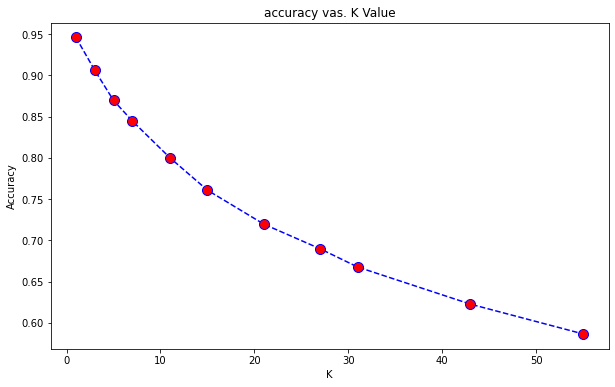

In [27]:
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import matplotlib.ticker as ticker
%matplotlib inline

# Instantiating another "object" of KNeighborsClassifier "class" with keyList containing multiple K values
keyList = [1, 3, 5, 7, 11, 15, 21, 27, 31, 43, 55]
print(keyList)
acc = []

for k in keyList:
    knn = KNeighborsClassifier(n_neighbors=k) 
    knn.fit(X_train, y_train)
    y_predict_knn = knn.predict(X_test)
    acc.append(accuracy_score(y_test, y_predict_knn))

plt.figure(figsize=(10,6))
plt.plot(keyList, acc, color = 'blue', linestyle = 'dashed',
        marker = 'o', markerfacecolor = 'red', markersize = 10)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')

KNN Cross Validation

In [22]:
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import matplotlib.ticker as ticker
%matplotlib inline

# Instantiating another "object" of KNeighborsClassifier "class" with keyList containing multiple K values
keyList = [1, 3, 5, 7, 11, 15, 21]
print(keyList)
acc = []

accuracy_pca_knn = []


for k in keyList:
    my_knn_pca = KNeighborsClassifier(n_neighbors=k) 
# function cross_val_score performs Cross Validation:
    accuracy_list_knn = cross_val_score(my_knn_pca, X_normalized, label_df, cv=10, scoring='accuracy')
    accuracy_cv_knn= accuracy_list_knn.mean()
    accuracy_pca_knn.append(accuracy_cv_knn)

print(accuracy_pca_knn)

[1, 3, 5, 7, 11, 15, 21]


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

[0.8012878621362216, 0.7464594718186205, 0.7192710915057945, 0.6955500731409687, 0.6542398771130666, 0.6233315395479156, 0.591167703777813]


Text(0, 0.5, 'Accuracy')

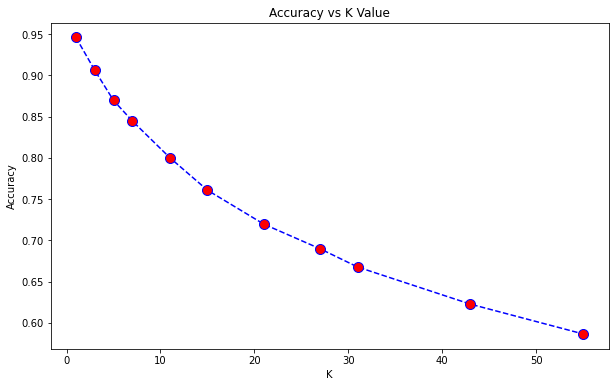

In [30]:
plt.figure(figsize=(10,6))
plt.plot(keyList, acc, color = 'blue', linestyle = 'dashed',
        marker = 'o', markerfacecolor = 'red', markersize = 10)
plt.title('Accuracy vs K Value')
plt.xlabel('K')

plt.ylabel('Accuracy')

# Since Accuraccy decreases as K decreases, K = 1 is the best choice? Does it mean overfitting?

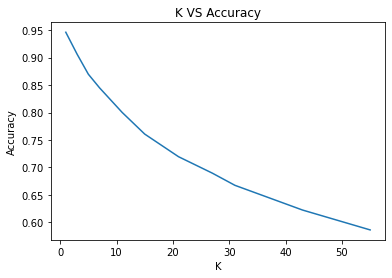

In [31]:
plt.plot(keyList,acc) 
plt.xlabel('K') 

plt.ylabel('Accuracy') 
plt.title('K VS Accuracy')
plt.show()

In [34]:
chart = pd.DataFrame()
chart['K'] = keyList
chart['Accuracy'] = acc
chart

,K,Accuracy
0,1,0.946131
1,3,0.906332
2,5,0.869749
3,7,0.844824
4,11,0.800201
5,15,0.760804
6,21,0.719598
7,27,0.689648
8,31,0.667538
9,43,0.622513


In [23]:
X.shape

(19898, 4096)

In [22]:
from  sklearn.decomposition  import  PCA

k = 50  #  k  is the number of components (new features) after dimensionality reduction

my_pca = PCA(n_components = k)
# X_Train is feature matrix of training set before dimensionality reduction, 

# X_Train_New is feature matrix of training set after dimensionality reduction:

X_train_new = my_pca. fit_transform(X_train)

X_test_new = my_pca. transform(X_test)

In [24]:
from  sklearn.decomposition  import  PCA

  #  k  is the number of components (new features) after dimensionality reduction

my_pca = PCA(n_components = 0.99)
# X_Train is feature matrix of training set before dimensionality reduction, 

# X_Train_New is feature matrix of training set after dimensionality reduction:

X_train_new = my_pca. fit_transform(X_train)

X_test_new = my_pca. transform(X_test)

X_normalized_pca = my_pca.fit_transform(X_normalized)

In [23]:
pd.DataFrame(X_train_new)

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,-16.581847,15.904544,2.986564,-2.900385,-4.898011,0.801969,2.773610,0.264839,8.078169,1.835230,...,-0.015636,0.812781,0.509407,2.148376,2.644732,1.918611,-0.310187,-1.253955,3.920292,-0.559749
1,-15.818933,15.534804,1.812462,-5.695752,-10.772180,-0.902570,5.017006,-5.872044,1.149736,-1.016051,...,0.411145,-1.342008,1.870119,0.233722,-1.964213,-0.154724,0.851988,-0.934210,0.072202,-1.386986
2,38.051961,12.480706,-18.496067,26.149586,3.375234,-7.056741,4.483368,-1.486603,18.485879,-5.348913,...,10.391750,6.164449,-0.667332,-4.131950,0.173911,7.624113,-3.038057,-3.696803,-3.607427,-4.615426
3,67.347656,-14.043779,10.092888,12.928087,7.182600,-5.147640,1.106676,-4.058407,7.136514,-12.028212,...,0.465495,6.416918,3.940751,5.413958,0.936144,-0.848313,-2.229017,6.395068,3.782564,-7.589400
4,-14.257862,-7.847727,-6.792208,-7.979539,-8.625202,-5.853633,-7.697688,-2.334375,-8.378895,-5.811199,...,-2.069377,3.835563,7.201444,-1.098880,-0.670479,-1.929644,-1.776822,1.730069,-2.306426,4.864540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14918,54.092855,-1.232991,-6.547918,14.878192,11.243753,0.676628,15.293064,3.706899,12.273196,-12.077437,...,0.712562,1.243158,2.149505,1.174834,2.606258,-4.312952,2.479773,3.730061,3.540477,7.538371
14919,47.937506,-9.360436,-4.338031,5.334342,10.919415,1.923669,7.643879,-3.275510,-3.527958,-13.542710,...,5.395165,0.900875,0.132967,-1.962705,-4.181631,1.765158,-0.800323,1.554798,-7.816172,-2.250209
14920,16.929479,3.032336,-24.428687,-1.483453,-2.073136,10.500814,13.953582,3.956457,-0.624601,4.953416,...,-0.591632,-5.956070,-2.683465,0.919383,2.058601,-5.104895,-6.397875,-0.734534,-2.185684,0.672318
14921,-0.314354,12.387258,2.822704,12.951238,-8.248830,13.581633,10.340694,11.927118,-5.961934,8.754660,...,-6.718080,-2.805684,0.301652,-6.582416,1.799153,-5.263219,-1.223181,2.021455,0.254381,-0.036020


In [24]:
X_normalized_pca = my_pca.fit_transform(X_normalized)

# Random Forest after PCA: 0.8984924623115578 
# 10 Folds: 0.7273619227358512

In [34]:
my_RandomForest_new = RandomForestClassifier(n_estimators = 19, bootstrap = True, random_state=2)

#train the random forest classifier
my_RandomForest_new.fit(X_train_new, y_train)

y_predict_rf = my_RandomForest_new.predict(X_test_new)

score__rf = accuracy_score(y_test, y_predict_rf)

print(score__rf)


<ipython-input-34-be9de6fbb84c>:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  my_RandomForest_new.fit(X_train_new, y_train)


0.9005025125628141


In [35]:
accuracy_list_rf = cross_val_score(my_RandomForest_new, X_normalized_pca, label_df, cv=10, scoring='accuracy')
accuracy_cv_rf = accuracy_list_rf.mean()

print(accuracy_cv_rf)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector 

0.7321356152305014


0.9878230586303884       AVC
0.9883177687972674       Abscesso
0.9998207686622321       Agenesia_Cerebelar
0.9833898399148364       Astrocitoma_Pilocitico
0.997864606194534       Atrofia_Cerebelar
0.9722270351439545       Carcinoma_Basocelular
0.9843491960017383       Cisto
0.9986846756074869       Doenca_de_Creutzfeldt-Jakob
0.9856524224841563       Doenca_de_Erdheim_Chester
0.9996185781205676       Doenca_de_Neuro-Behcet
0.9938528812666155       Encefalite
0.9987951237951238       Encefalomalacia
0.9995716096732953       Encefalopatia_Hipoxico-isquemica
0.9953443293574817       Esclerose_Multipla
0.9989820647715384       Esquizencefalia
0.9940894267078613       Ganglioglioma
0.988253280315303       Germinoma
0.9882831477083792       Glioblastoma
0.9951230596253479       Glioma
0.9988896414485908       Hemangioblastoma
0.9991729548528058       Hematoma_Subdural
0.9842697686205546       Hemorragia
0.9999124613800207       Hidrocefalia
0.9997569230769231       Hipotensao_Intracraniana
0

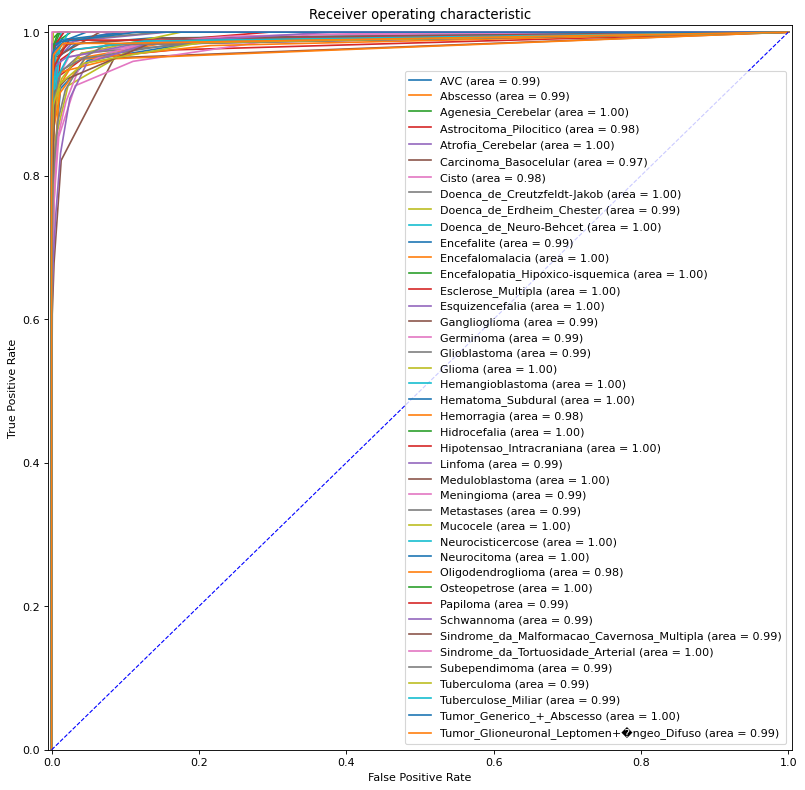

In [36]:
%matplotlib inline
y_predict_prob_rf = my_RandomForest_new.predict_proba(X_test_new)

plt.figure(figsize=(12, 12), dpi=80)

pos_label = my_RandomForest_new.classes_
AUClist = []


for i in range(len(pos_label)):
    #fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob[:,1], pos_label= i)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob_rf[:,i], pos_label= pos_label[i])

    AUC = metrics.auc(fpr, tpr)
    print(str(AUC) + "       " + pos_label[i])
    AUClist.append(AUC)
    # Roc Curve:
    plt.plot(fpr, tpr, label='%s (area = %0.2f)' % (pos_label[i], AUC))

# Random Guess line:
plt.plot([0, 1], [0, 1], color='blue', lw=1, linestyle='--')

# Defining The Range of X-Axis and Y-Axis:
plt.xlim([-0.005, 1.005])
plt.ylim([0.0, 1.01])

# Labels, Title, Legend:
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41]),
 [Text(0, 0, 'AVC'),
  Text(1, 0, 'Abscesso'),
  Text(2, 0, 'Agenesia_Cerebelar'),
  Text(3, 0, 'Astrocitoma_Pilocitico'),
  Text(4, 0, 'Atrofia_Cerebelar'),
  Text(5, 0, 'Carcinoma_Basocelular'),
  Text(6, 0, 'Cisto'),
  Text(7, 0, 'Doenca_de_Creutzfeldt-Jakob'),
  Text(8, 0, 'Doenca_de_Erdheim_Chester'),
  Text(9, 0, 'Doenca_de_Neuro-Behcet'),
  Text(10, 0, 'Encefalite'),
  Text(11, 0, 'Encefalomalacia'),
  Text(12, 0, 'Encefalopatia_Hipoxico-isquemica'),
  Text(13, 0, 'Esclerose_Multipla'),
  Text(14, 0, 'Esquizencefalia'),
  Text(15, 0, 'Ganglioglioma'),
  Text(16, 0, 'Germinoma'),
  Text(17, 0, 'Glioblastoma'),
  Text(18, 0, 'Glioma'),
  Text(19, 0, 'Hemangioblastoma'),
  Text(20, 0, 'Hematoma_Subdural'),
  Text(21, 0, 'Hemorragia'),
  Text(22, 0, 'Hidrocefalia'),
  Text(23, 0, 'Hipotensao_

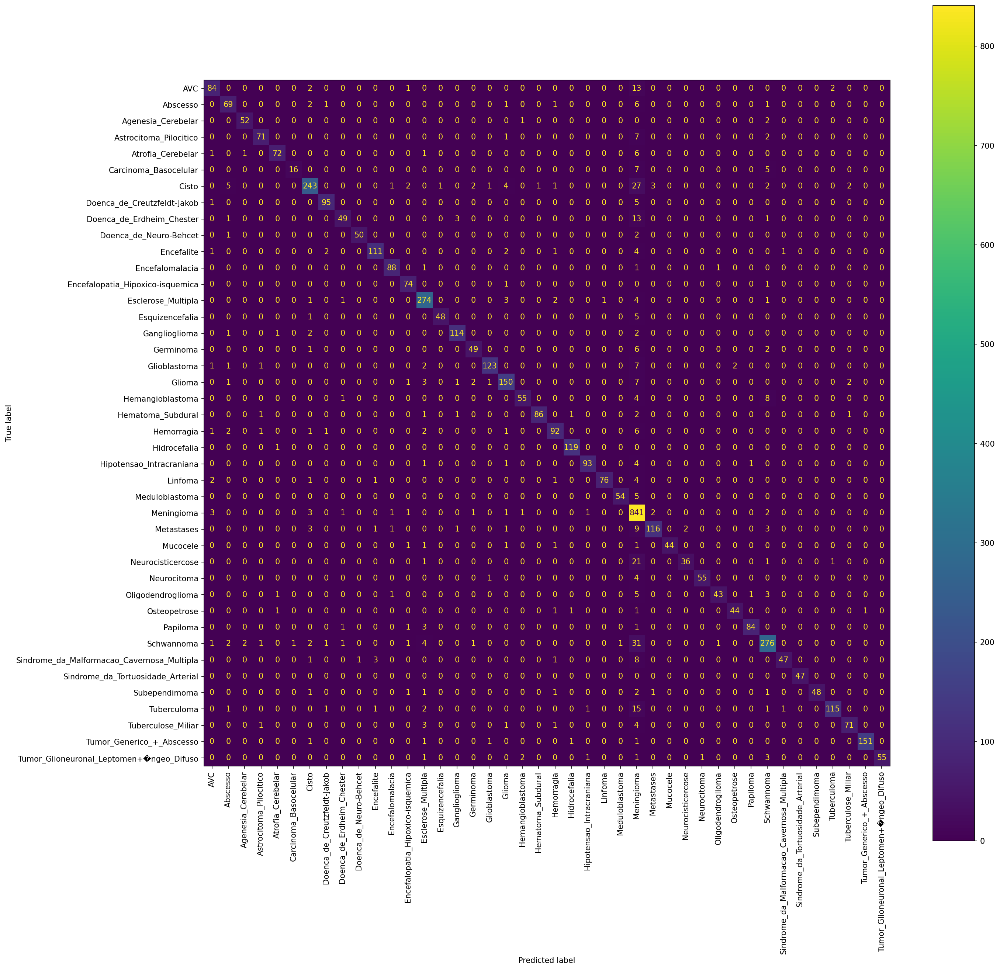

In [38]:
cm = confusion_matrix(y_true=y_test,y_pred=y_predict_rf)
fig, ax = plt.subplots(figsize=(20, 20), dpi=150)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=pos_label)
disp.plot(ax=ax)
plt.xticks(rotation=90)

In [39]:
c_matrix_rf = confusion_matrix(y_true=y_test,y_pred=y_predict_rf)
cMatrix_df = pd.DataFrame(c_matrix_rf)

cMatrix_df.columns=pos_label
cMatrix_df.index=pos_label
cMatrix_df.rename_axis(index='Predict', columns='Predict', axis=None, copy=True, inplace=False)

Predict,AVC,Abscesso,Agenesia_Cerebelar,Astrocitoma_Pilocitico,Atrofia_Cerebelar,Carcinoma_Basocelular,Cisto,Doenca_de_Creutzfeldt-Jakob,Doenca_de_Erdheim_Chester,Doenca_de_Neuro-Behcet,...,Osteopetrose,Papiloma,Schwannoma,Sindrome_da_Malformacao_Cavernosa_Multipla,Sindrome_da_Tortuosidade_Arterial,Subependimoma,Tuberculoma,Tuberculose_Miliar,Tumor_Generico_+_Abscesso,Tumor_Glioneuronal_Leptomen+�ngeo_Difuso
Predict,,,,,,,,,,,,,,,,,,,,,
AVC,86,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Abscesso,0,67,0,0,0,0,2,0,0,0,...,1,0,0,0,0,0,0,0,0,0
Agenesia_Cerebelar,0,0,54,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Astrocitoma_Pilocitico,0,0,0,70,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Atrofia_Cerebelar,2,0,2,0,70,0,0,1,0,0,...,0,0,3,0,0,0,0,0,0,0
Carcinoma_Basocelular,0,0,0,0,0,17,1,0,0,0,...,0,0,2,0,0,0,0,0,0,0
Cisto,0,1,0,3,2,0,239,0,2,1,...,0,0,2,0,0,0,1,1,2,0
Doenca_de_Creutzfeldt-Jakob,1,0,0,0,0,0,0,92,0,1,...,0,0,0,0,0,0,0,0,0,0
Doenca_de_Erdheim_Chester,1,0,0,2,0,0,1,0,50,0,...,0,0,1,0,0,0,0,0,0,0


# Decision Tree after PCA:0.7117587939698492
# 10 folds:0.5145261501069955

In [25]:
my_Decision_Tree_new = DecisionTreeClassifier(random_state=13)

#train the Decison Tree classifier
my_Decision_Tree_new.fit(X_train_new, y_train)

y_predict_dt_new = my_Decision_Tree_new.predict(X_test_new)

score_dt_new = accuracy_score(y_test, y_predict_dt_new)

print(score_dt_new)

0.7033165829145729


In [26]:
accuracy_list_new = cross_val_score(my_Decision_Tree_new, X_normalized_pca, label_df, cv=10, scoring='accuracy')
accuracy_cv_new = accuracy_list_new.mean()

print(accuracy_cv_new)

0.5170388139793992


0.7941971165646641       AVC
0.8121585009611164       Abscesso
0.9081762749445677       Agenesia_Cerebelar
0.7924139914331987       Astrocitoma_Pilocitico
0.7931291528553481       Atrofia_Cerebelar
0.748483929654336       Carcinoma_Basocelular
0.8079747935680139       Cisto
0.877084712985045       Doenca_de_Creutzfeldt-Jakob
0.7515919789804036       Doenca_de_Erdheim_Chester
0.818519853104659       Doenca_de_Neuro-Behcet
0.8893214607830884       Encefalite
0.8546858546858547       Encefalomalacia
0.8187962634694513       Encefalopatia_Hipoxico-isquemica
0.881995769464033       Esclerose_Multipla
0.8681350523455786       Esquizencefalia
0.8588954685890834       Ganglioglioma
0.7372101014776321       Germinoma
0.8535302939321612       Glioblastoma
0.8785197925644149       Glioma
0.8298634004243637       Hemangioblastoma
0.9067586437781097       Hematoma_Subdural
0.7799111496786183       Hemorragia
0.9234552008238929       Hidrocefalia
0.8982564102564102       Hipotensao_Intracraniana
0.8

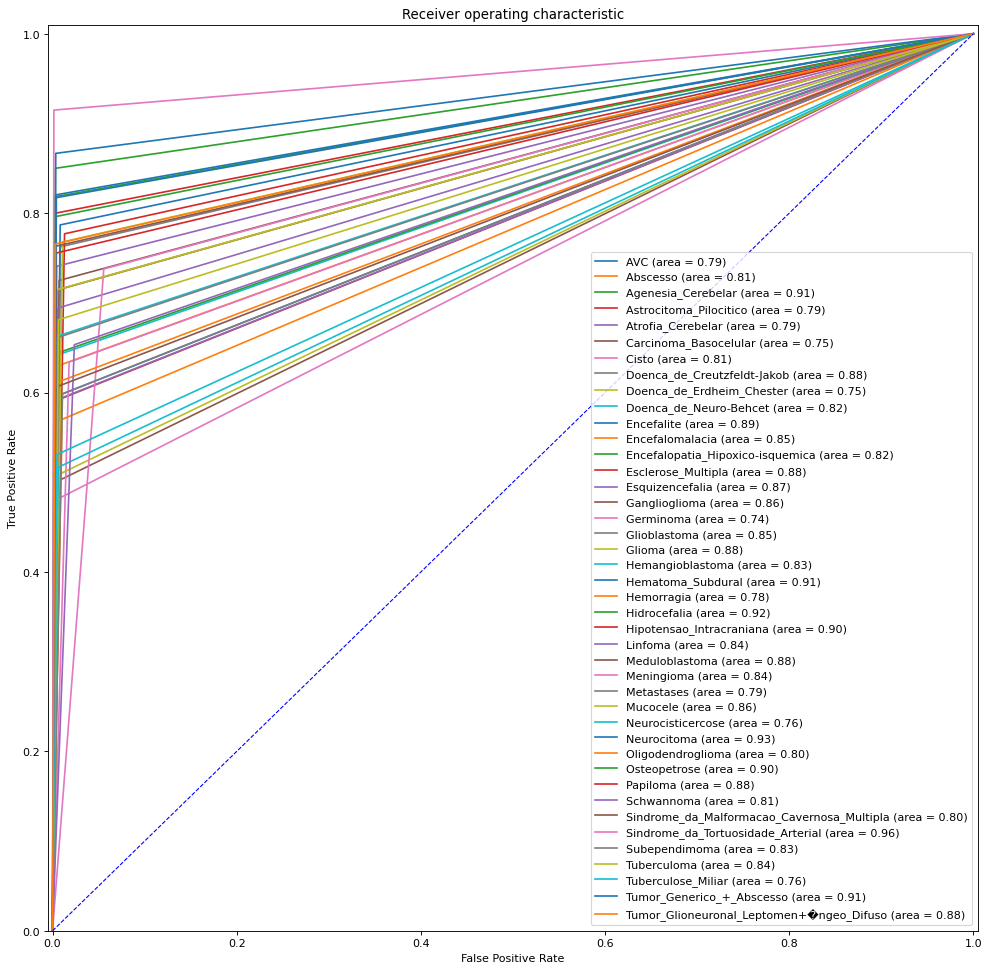

In [27]:
%matplotlib inline
y_predict_prob_dt_new = my_Decision_Tree_new.predict_proba(X_test_new)

plt.figure(figsize=(15, 15), dpi=80)

pos_label = my_Decision_Tree_new.classes_
AUClist = []


for i in range(len(pos_label)):
    #fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob[:,1], pos_label= i)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob_dt_new[:,i], pos_label= pos_label[i])

    AUC = metrics.auc(fpr, tpr)
    print(str(AUC) + "       " + pos_label[i])
    AUClist.append(AUC)
    # Roc Curve:
    plt.plot(fpr, tpr, label='%s (area = %0.2f)' % (pos_label[i], AUC))

# Random Guess line:
plt.plot([0, 1], [0, 1], color='blue', lw=1, linestyle='--')

# Defining The Range of X-Axis and Y-Axis:
plt.xlim([-0.005, 1.005])
plt.ylim([0.0, 1.01])

# Labels, Title, Legend:
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

In [28]:
cm = confusion_matrix(y_true=y_test,y_pred=y_predict_prob_dt_new)
fig, ax = plt.subplots(figsize=(20, 20), dpi=150)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=pos_label)
disp.plot(ax=ax)
plt.xticks(rotation=90)

ValueError: Classification metrics can't handle a mix of multiclass and multilabel-indicator targets

# Ada Boost after PCA: 0.17949748743718594
# 10 folds: 0.17645080606653177

In [29]:
#define an adaBoost classifier
my_AdaBoost_new = AdaBoostClassifier(n_estimators = 29,random_state=13)
#train the testing set on AdaBoost classifier
my_AdaBoost_new.fit(X_train_new, y_train)

#define predict results from AdaBoost
#compare results with testing set
y_ada_predict_new = my_AdaBoost_new.predict(X_test_new)
ada_score_new = accuracy_score(y_test, y_ada_predict_new)
print(ada_score_new)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.18010050251256282


In [30]:
accuracy_list_ada = cross_val_score(my_AdaBoost_new, X_normalized_pca, label_df, cv=10, scoring='accuracy')
accuracy_cv_ada = accuracy_list_ada.mean()

print(accuracy_cv_ada)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usi

0.17650108258739652


0.41171038495431       AVC
0.5063040154989481       Abscesso
0.7106707317073171       Agenesia_Cerebelar
0.711789946873723       Astrocitoma_Pilocitico
0.3889683512691277       Atrofia_Cerebelar
0.7399903260273182       Carcinoma_Basocelular
0.4689605968419528       Cisto
0.7126590069757899       Doenca_de_Creutzfeldt-Jakob
0.7246910313955892       Doenca_de_Erdheim_Chester
0.7095692807801707       Doenca_de_Neuro-Behcet
0.30558417473727595       Encefalite
0.7887574137574137       Encefalomalacia
0.711573790569504       Encefalopatia_Hipoxico-isquemica
0.6334796529949697       Esclerose_Multipla
0.617862223125381       Esquizencefalia
0.43403707518022666       Ganglioglioma
0.3676337548126486       Germinoma
0.5765676532801454       Glioblastoma
0.5213602187286398       Glioma
0.7112288567352761       Hemangioblastoma
0.5912139392898204       Hematoma_Subdural
0.5287102880532026       Hemorragia
0.5219121180913149       Hidrocefalia
0.7810707692307692       Hipotensao_Intracraniana
0.

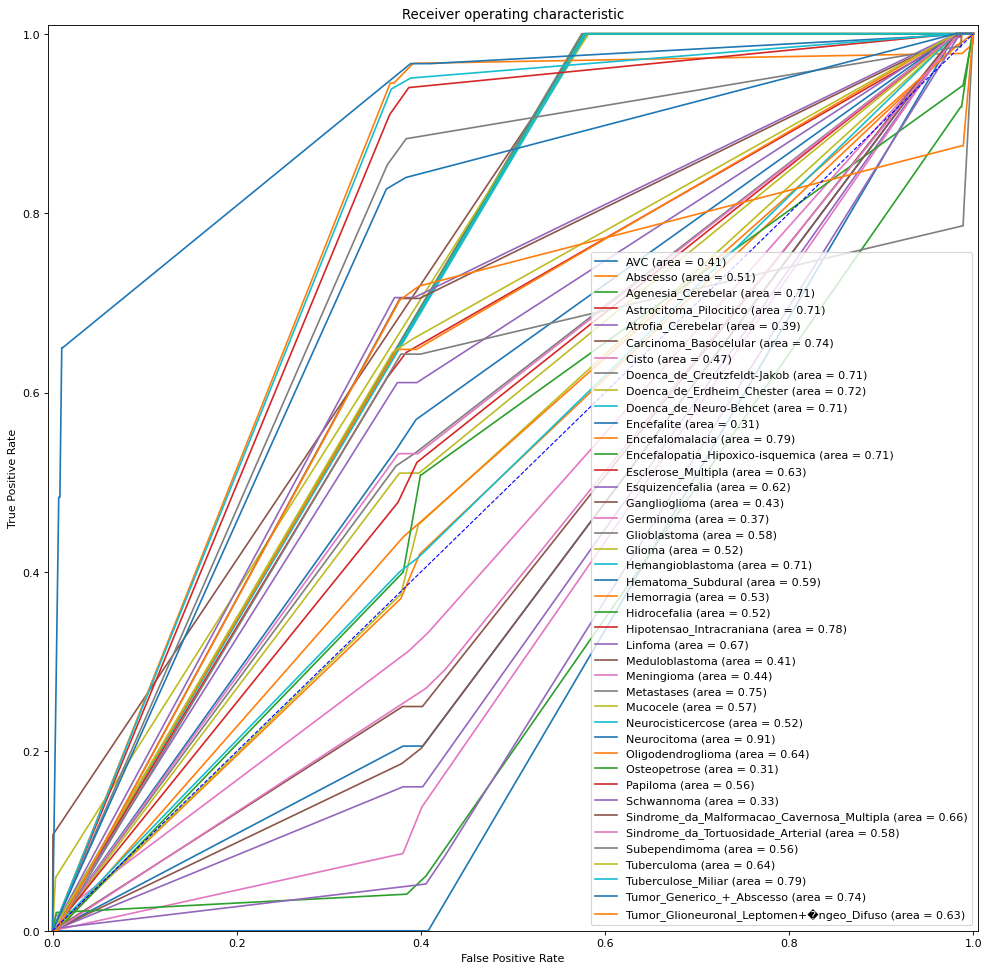

In [31]:
%matplotlib inline
y_predict_prob_ada = my_AdaBoost_new.predict_proba(X_test_new)

plt.figure(figsize=(15, 15), dpi=80)

pos_label = my_AdaBoost_new.classes_
AUClist = []


for i in range(len(pos_label)):
    #fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob[:,1], pos_label= i)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob_ada[:,i], pos_label= pos_label[i])

    AUC = metrics.auc(fpr, tpr)
    print(str(AUC) + "       " + pos_label[i])
    AUClist.append(AUC)
    # Roc Curve:
    plt.plot(fpr, tpr, label='%s (area = %0.2f)' % (pos_label[i], AUC))

# Random Guess line:
plt.plot([0, 1], [0, 1], color='blue', lw=1, linestyle='--')

# Defining The Range of X-Axis and Y-Axis:
plt.xlim([-0.005, 1.005])
plt.ylim([0.0, 1.01])

# Labels, Title, Legend:
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41]),
 [Text(0, 0, 'AVC'),
  Text(1, 0, 'Abscesso'),
  Text(2, 0, 'Agenesia_Cerebelar'),
  Text(3, 0, 'Astrocitoma_Pilocitico'),
  Text(4, 0, 'Atrofia_Cerebelar'),
  Text(5, 0, 'Carcinoma_Basocelular'),
  Text(6, 0, 'Cisto'),
  Text(7, 0, 'Doenca_de_Creutzfeldt-Jakob'),
  Text(8, 0, 'Doenca_de_Erdheim_Chester'),
  Text(9, 0, 'Doenca_de_Neuro-Behcet'),
  Text(10, 0, 'Encefalite'),
  Text(11, 0, 'Encefalomalacia'),
  Text(12, 0, 'Encefalopatia_Hipoxico-isquemica'),
  Text(13, 0, 'Esclerose_Multipla'),
  Text(14, 0, 'Esquizencefalia'),
  Text(15, 0, 'Ganglioglioma'),
  Text(16, 0, 'Germinoma'),
  Text(17, 0, 'Glioblastoma'),
  Text(18, 0, 'Glioma'),
  Text(19, 0, 'Hemangioblastoma'),
  Text(20, 0, 'Hematoma_Subdural'),
  Text(21, 0, 'Hemorragia'),
  Text(22, 0, 'Hidrocefalia'),
  Text(23, 0, 'Hipotensao_

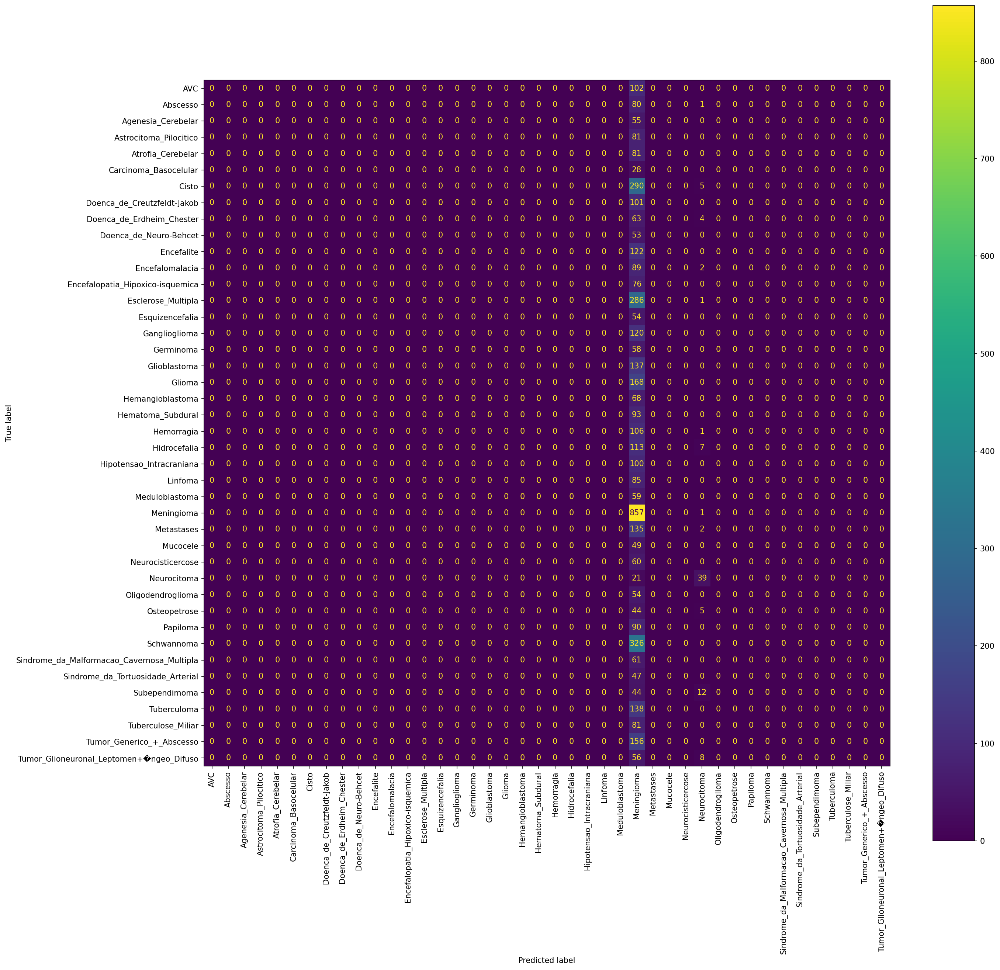

In [32]:
cm = confusion_matrix(y_true=y_test,y_pred=y_ada_predict_new)
fig, ax = plt.subplots(figsize=(20, 20), dpi=150)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=pos_label)
disp.plot(ax=ax)
plt.xticks(rotation=90)

# XGboost after PCA: 0.8677386934673367
# 10 folds: 0.7115310590155403

In [44]:
my_XGBoost_new = XGBClassifier(n_estimators = 29,random_state=13)

#train the testing set on xgBoost classifier
my_XGBoost_new.fit(X_train_new, y_train)

#define predict results from XGBoost
#compare results with testing set
y_xg_predict_new = my_XGBoost_new.predict(X_test_new)
xg_score_new = accuracy_score(y_test, y_xg_predict_new)
print(xg_score_new)

C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:40:18] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.869748743718593


In [45]:
accuracy_list_xg = cross_val_score(my_XGBoost_new, X_normalized_pca, label_df, cv=10, scoring='accuracy')
accuracy_cv_xg= accuracy_list_xg.mean()

print(accuracy_cv_xg)

C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:40:49] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:41:26] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:42:03] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:42:40] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:43:18] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:43:55] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:44:33] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:45:13] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:45:54] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\john17\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[00:46:32] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.7124353795119388


0.9958877045585318       AVC
0.9971141281589451       Abscesso
0.9997339246119734       Agenesia_Cerebelar
0.9964632934255602       Astrocitoma_Pilocitico
0.9992205118890857       Atrofia_Cerebelar
0.9994513269225216       Carcinoma_Basocelular
0.9862320730117341       Cisto
0.999128534109053       Doenca_de_Creutzfeldt-Jakob
0.9980050846014428       Doenca_de_Erdheim_Chester
0.9995514938704162       Doenca_de_Neuro-Behcet
0.998113386007641       Encefalite
0.9993339993339994       Encefalomalacia
0.9992157368313619       Encefalopatia_Hipoxico-isquemica
0.9947943299520758       Esclerose_Multipla
0.9994731573678942       Esquizencefalia
0.9982131822863028       Ganglioglioma
0.9969984501342983       Germinoma
0.9925664523254165       Glioblastoma
0.9974454416674097       Glioma
0.9896636257926852       Hemangioblastoma
0.9998700514948483       Hematoma_Subdural
0.9948452222793909       Hemorragia
0.9999673875729489       Hidrocefalia
0.999454358974359       Hipotensao_Intracraniana
0.

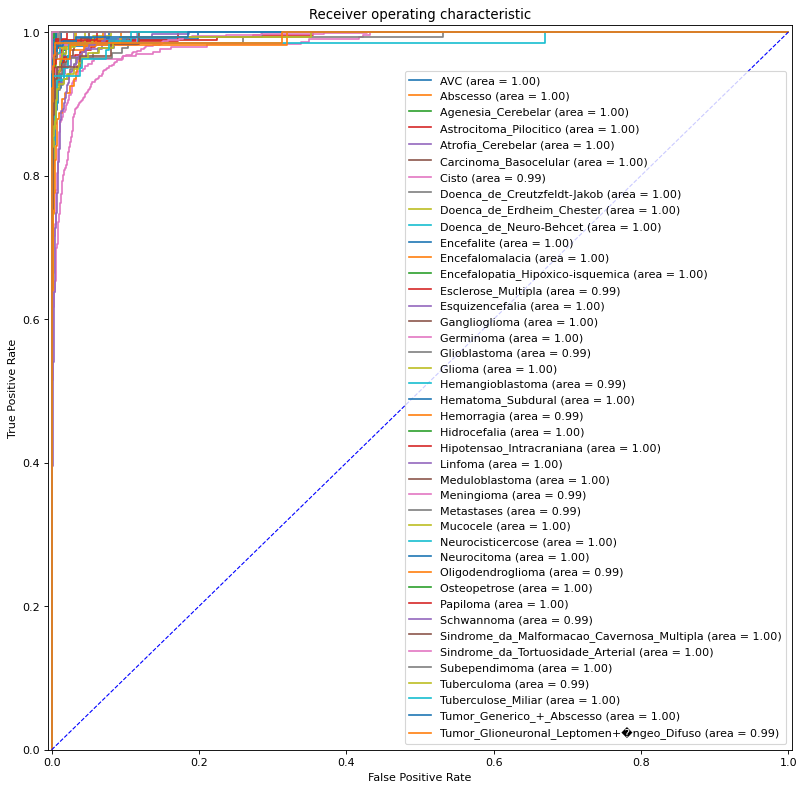

In [46]:
%matplotlib inline
y_predict_prob_xg = my_XGBoost_new.predict_proba(X_test_new)

plt.figure(figsize=(12, 12), dpi=80)

pos_label = my_XGBoost_new.classes_
AUClist = []


for i in range(len(pos_label)):
    #fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob[:,1], pos_label= i)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob_xg[:,i], pos_label= pos_label[i])

    AUC = metrics.auc(fpr, tpr)
    print(str(AUC) + "       " + pos_label[i])
    AUClist.append(AUC)
    # Roc Curve:
    plt.plot(fpr, tpr, label='%s (area = %0.2f)' % (pos_label[i], AUC))

# Random Guess line:
plt.plot([0, 1], [0, 1], color='blue', lw=1, linestyle='--')

# Defining The Range of X-Axis and Y-Axis:
plt.xlim([-0.005, 1.005])
plt.ylim([0.0, 1.01])

# Labels, Title, Legend:
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41]),
 [Text(0, 0, 'AVC'),
  Text(1, 0, 'Abscesso'),
  Text(2, 0, 'Agenesia_Cerebelar'),
  Text(3, 0, 'Astrocitoma_Pilocitico'),
  Text(4, 0, 'Atrofia_Cerebelar'),
  Text(5, 0, 'Carcinoma_Basocelular'),
  Text(6, 0, 'Cisto'),
  Text(7, 0, 'Doenca_de_Creutzfeldt-Jakob'),
  Text(8, 0, 'Doenca_de_Erdheim_Chester'),
  Text(9, 0, 'Doenca_de_Neuro-Behcet'),
  Text(10, 0, 'Encefalite'),
  Text(11, 0, 'Encefalomalacia'),
  Text(12, 0, 'Encefalopatia_Hipoxico-isquemica'),
  Text(13, 0, 'Esclerose_Multipla'),
  Text(14, 0, 'Esquizencefalia'),
  Text(15, 0, 'Ganglioglioma'),
  Text(16, 0, 'Germinoma'),
  Text(17, 0, 'Glioblastoma'),
  Text(18, 0, 'Glioma'),
  Text(19, 0, 'Hemangioblastoma'),
  Text(20, 0, 'Hematoma_Subdural'),
  Text(21, 0, 'Hemorragia'),
  Text(22, 0, 'Hidrocefalia'),
  Text(23, 0, 'Hipotensao_

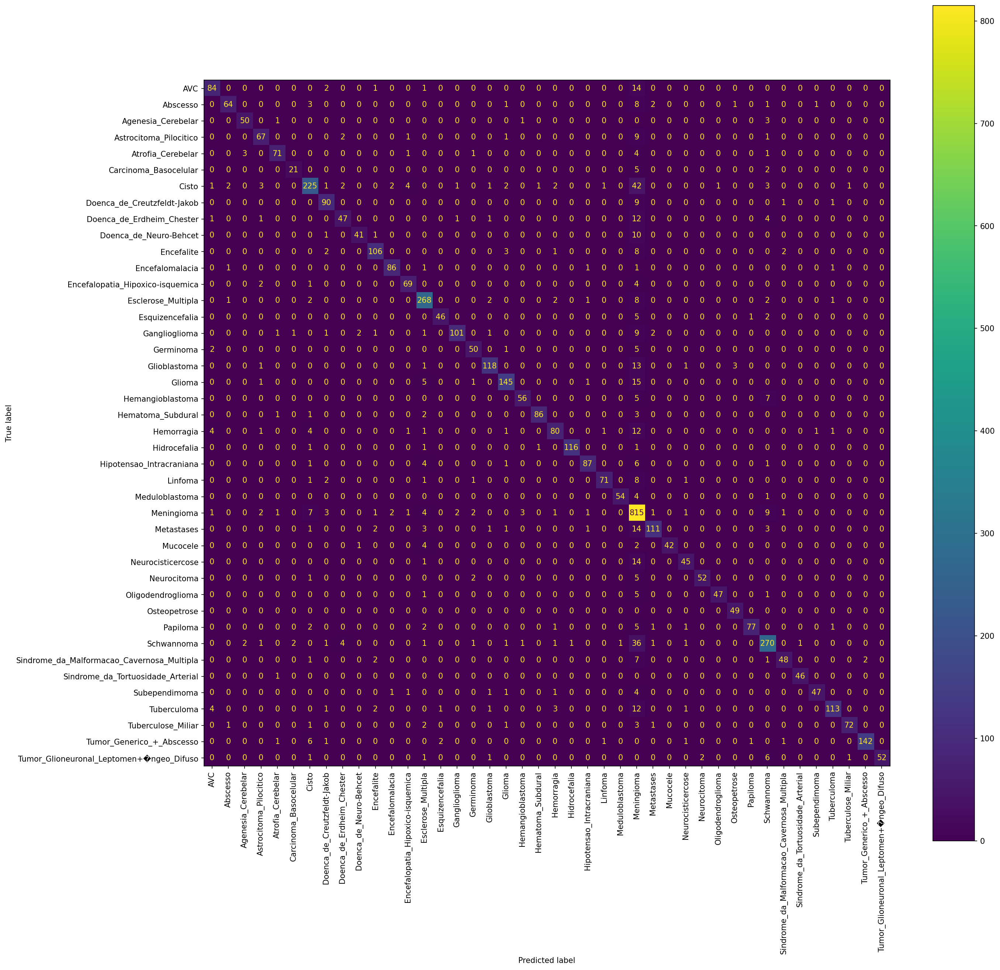

In [47]:
cm = confusion_matrix(y_true=y_test,y_pred=y_xg_predict_new)
fig, ax = plt.subplots(figsize=(20, 20), dpi=150)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=pos_label)
disp.plot(ax=ax)
plt.xticks(rotation=90)

# KNN Search for K
# KNN after PCA: 0.9750753768844221(highest)
# 10 folds: 0.8448589857280367(highest)

In [48]:
# Instantiating another "object" of KNeighborsClassifier "class" with keyList containing multiple K values
keyList = [1, 3, 5, 7, 11, 15, 21, 27, 31]
print(keyList)
accuracy_knn = []

for k in keyList:
    my_knn_for_multipleK = KNeighborsClassifier(n_neighbors=k) # name of the object is arbitrary!
    my_knn_for_multipleK.fit(X_train_new, y_train)
    y_predict_knn = my_knn_for_multipleK.predict(X_test_new)
    accuracy_knn.append(accuracy_score(y_test, y_predict_knn))

print(accuracy_knn)

[1, 3, 5, 7, 11, 15, 21, 27, 31]


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

[0.9750753768844221, 0.9581909547738694, 0.9459296482412061, 0.9344723618090452, 0.912964824120603, 0.8954773869346734, 0.8687437185929648, 0.8522613065326633, 0.8412060301507538]


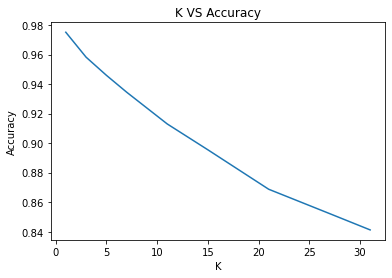

In [49]:
plt.plot(keyList,accuracy_knn) 
plt.xlabel('K') 

plt.ylabel('Accuracy') 
plt.title('K VS Accuracy')
plt.show()

In [50]:
chart = pd.DataFrame()
chart['K'] = keyList
chart['Accuracy'] = accuracy_knn
chart

,K,Accuracy
0,1,0.975075
1,3,0.958191
2,5,0.945930
3,7,0.934472
4,11,0.912965
5,15,0.895477
6,21,0.868744
7,27,0.852261
8,31,0.841206


In [53]:

# Applying 10-fold cross validation with "KNN" classifier:

# In the following line, "my_knn" is instantiated as an "object" of LogisticRegression "class". 
k = 1

my_knn_pca = KNeighborsClassifier(n_neighbors=k) 
# function cross_val_score performs Cross Validation:
accuracy_list_knn = cross_val_score(my_knn_pca, X_normalized_pca, label_df, cv=10, scoring='accuracy')
accuracy_cv_knn= accuracy_list_knn.mean()

print(accuracy_cv_knn)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

0.8448589857280367


In [54]:
keyList = [1, 3, 5, 7]
accuracy_pca_knn = []


for k in keyList:
    my_knn_pca = KNeighborsClassifier(n_neighbors=k) 
# function cross_val_score performs Cross Validation:
    accuracy_list_knn = cross_val_score(my_knn_pca, X_normalized_pca, label_df, cv=10, scoring='accuracy')
    accuracy_cv_knn= accuracy_list_knn.mean()
    accuracy_pca_knn.append(accuracy_cv_knn)
    
    
print(accuracy_pca_knn)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

[0.8448589857280367, 0.8162141527143005, 0.7996806304018836, 0.787820424394471]


# Find best number features with PCA


In [55]:
# PCA (Principal Component Analysis) 
from sklearn.decomposition import PCA
X_array = X.to_numpy()

# KNN

In [59]:
def kFeaturesKNNAccuracy(k):
    # PCA (Principal Component Analysis) 
    pca = PCA(n_components=k)
    pca.fit(X_array)
    pdatransform = pca.transform(X)

    X_updated = pd.DataFrame(pdatransform)
    # KNN with k = 1
    my_knn_feature_select = KNeighborsClassifier(n_neighbors=1) 
    KNN_classifier_scores = cross_val_score(my_knn_feature_select,X_updated,label_df,cv=10,scoring="accuracy")
    return KNN_classifier_scores.mean()

In [61]:
kValues = [5,15,20,25,30,40, 45,50,60,70,75,80,85,90,95,100]

accuracyList_knn = []

for k in kValues:
    acc = kFeaturesKNNAccuracy(k)
    accuracyList_knn.append(acc)
    print(k," : ",acc)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

5  :  0.5142747422380884


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

15  :  0.8022909924180986


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

20  :  0.8191262749140373


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

25  :  0.8285239419824106


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

30  :  0.8366662624333332


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

40  :  0.8343043270651902


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

45  :  0.8340533992233666


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

50  :  0.8338525457857411


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

60  :  0.8311387253007118


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

70  :  0.8305358618128349


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

75  :  0.8306867924337625


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

80  :  0.8295311398622068


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

85  :  0.8284758634802974


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

90  :  0.8280235011154314


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

95  :  0.8271691034357307


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

100  :  0.8273198572045748


In [63]:
print(kValues)
print(accuracyList_knn)

[5, 15, 20, 25, 30, 40, 45, 50, 60, 70, 75, 80, 85, 90, 95, 100]
[0.5142747422380884, 0.8022909924180986, 0.8191262749140373, 0.8285239419824106, 0.8366662624333332, 0.8343043270651902, 0.8340533992233666, 0.8338525457857411, 0.8311387253007118, 0.8305358618128349, 0.8306867924337625, 0.8295311398622068, 0.8284758634802974, 0.8280235011154314, 0.8271691034357307, 0.8273198572045748]


In [64]:
print(kValues, ":", accuracyList_knn)

[5, 15, 20, 25, 30, 40, 45, 50, 60, 70, 75, 80, 85, 90, 95, 100] : [0.5142747422380884, 0.8022909924180986, 0.8191262749140373, 0.8285239419824106, 0.8366662624333332, 0.8343043270651902, 0.8340533992233666, 0.8338525457857411, 0.8311387253007118, 0.8305358618128349, 0.8306867924337625, 0.8295311398622068, 0.8284758634802974, 0.8280235011154314, 0.8271691034357307, 0.8273198572045748]


# Test PCA when K = 30, 40
# K =30; accuracy: 0.845863581355748
# K =40; accuracy: 0.8459644628370612


In [68]:
k = 30  #  k  is the number of components (new features) after dimensionality reduction

my_pca = PCA(n_components = k)
X_normalized_pca30 = my_pca.fit_transform(X_normalized)

my_knn_pca = KNeighborsClassifier(n_neighbors=1) 
# function cross_val_score performs Cross Validation:
accuracy_list_knn = cross_val_score(my_knn_pca, X_normalized_pca30, label_df, cv=10, scoring='accuracy')
accuracy_cv_knn= accuracy_list_knn.mean()

print(accuracy_cv_knn)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

0.845863581355748


In [69]:
k = 40  #  k  is the number of components (new features) after dimensionality reduction

my_pca = PCA(n_components = k)
X_normalized_pca30 = my_pca.fit_transform(X_normalized)

my_knn_pca = KNeighborsClassifier(n_neighbors=1) 
# function cross_val_score performs Cross Validation:
accuracy_list_knn = cross_val_score(my_knn_pca, X_normalized_pca30, label_df, cv=10, scoring='accuracy')
accuracy_cv_knn= accuracy_list_knn.mean()

print(accuracy_cv_knn)

C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n

0.8459644628370612


# ROC Curve

In [51]:
my_knn_for_roc = KNeighborsClassifier(n_neighbors=40) # name of the object is arbitrary!
my_knn_for_roc.fit(X_train_new, y_train)
# Predicting the Binary Label:
y_predict_knn = my_knn_for_roc.predict(X_test_new)
score_knn = accuracy_score(y_test, y_predict_knn)
print(score_knn)

y_predict_prob_knn = my_knn_for_roc.predict_proba(X_test_new)


C:\Users\john17\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


0.817286432160804


0.9883592263090337       AVC
0.9976489225910287       Abscesso
0.9997339246119734       Agenesia_Cerebelar
0.9965995146488267       Astrocitoma_Pilocitico
0.9987462602228983       Atrofia_Cerebelar
0.9935567010309277       Carcinoma_Basocelular
0.9878726640591049       Cisto
0.9981250279315991       Doenca_de_Creutzfeldt-Jakob
0.9989614884015132       Doenca_de_Erdheim_Chester
0.9999271656712642       Doenca_de_Neuro-Behcet
0.9977519398175203       Encefalite
0.9998649998649999       Encefalomalacia
0.9993392851387501       Encefalopatia_Hipoxico-isquemica
0.9944375735810016       Esclerose_Multipla
0.9999887105150262       Esquizencefalia
0.9992619292825266       Ganglioglioma
0.9984238356721578       Germinoma
0.9921854962085436       Glioblastoma
0.9967724399932638       Glioma
0.9993391793236553       Hemangioblastoma
0.9999867848977813       Hematoma_Subdural
0.991028574939141       Hemorragia
0.9999665293511844       Hidrocefalia
0.9997394871794872       Hipotensao_Intracraniana


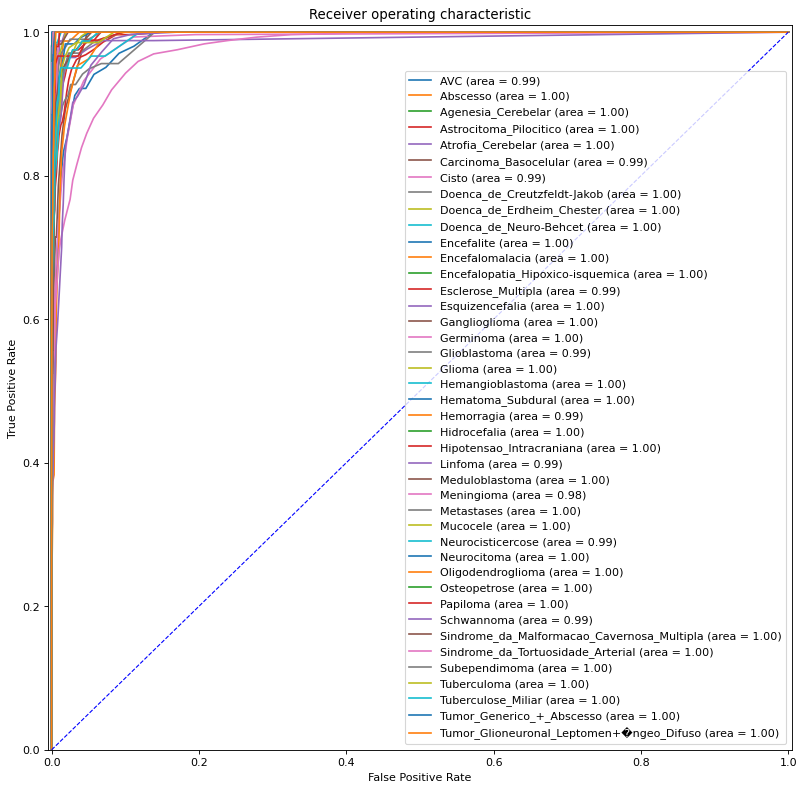

In [52]:
%matplotlib inline

plt.figure(figsize=(12, 12), dpi=80)

#pos_label = ["chinese", "spanish", "greek", "italian", "mexican", "southern_us", "filipino", "indian", "irish", "brazilian", "british", "cajun_creole", "french", "jamaican", "japanese", "korean", "moroccan", "russian", "thai", "vietnamese"]
pos_label = my_knn_for_roc.classes_
AUClist = []


for i in range(len(pos_label)):
    #fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob[:,1], pos_label= i)
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_predict_prob_knn[:,i], pos_label= pos_label[i])

    AUC = metrics.auc(fpr, tpr)
    print(str(AUC) + "       " + pos_label[i])
    AUClist.append(AUC)
    # Roc Curve:
    plt.plot(fpr, tpr, label='%s (area = %0.2f)' % (pos_label[i], AUC))

# Random Guess line:
plt.plot([0, 1], [0, 1], color='blue', lw=1, linestyle='--')

# Defining The Range of X-Axis and Y-Axis:
plt.xlim([-0.005, 1.005])
plt.ylim([0.0, 1.01])

# Labels, Title, Legend:
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41]),
 [Text(0, 0, 'AVC'),
  Text(1, 0, 'Abscesso'),
  Text(2, 0, 'Agenesia_Cerebelar'),
  Text(3, 0, 'Astrocitoma_Pilocitico'),
  Text(4, 0, 'Atrofia_Cerebelar'),
  Text(5, 0, 'Carcinoma_Basocelular'),
  Text(6, 0, 'Cisto'),
  Text(7, 0, 'Doenca_de_Creutzfeldt-Jakob'),
  Text(8, 0, 'Doenca_de_Erdheim_Chester'),
  Text(9, 0, 'Doenca_de_Neuro-Behcet'),
  Text(10, 0, 'Encefalite'),
  Text(11, 0, 'Encefalomalacia'),
  Text(12, 0, 'Encefalopatia_Hipoxico-isquemica'),
  Text(13, 0, 'Esclerose_Multipla'),
  Text(14, 0, 'Esquizencefalia'),
  Text(15, 0, 'Ganglioglioma'),
  Text(16, 0, 'Germinoma'),
  Text(17, 0, 'Glioblastoma'),
  Text(18, 0, 'Glioma'),
  Text(19, 0, 'Hemangioblastoma'),
  Text(20, 0, 'Hematoma_Subdural'),
  Text(21, 0, 'Hemorragia'),
  Text(22, 0, 'Hidrocefalia'),
  Text(23, 0, 'Hipotensao_

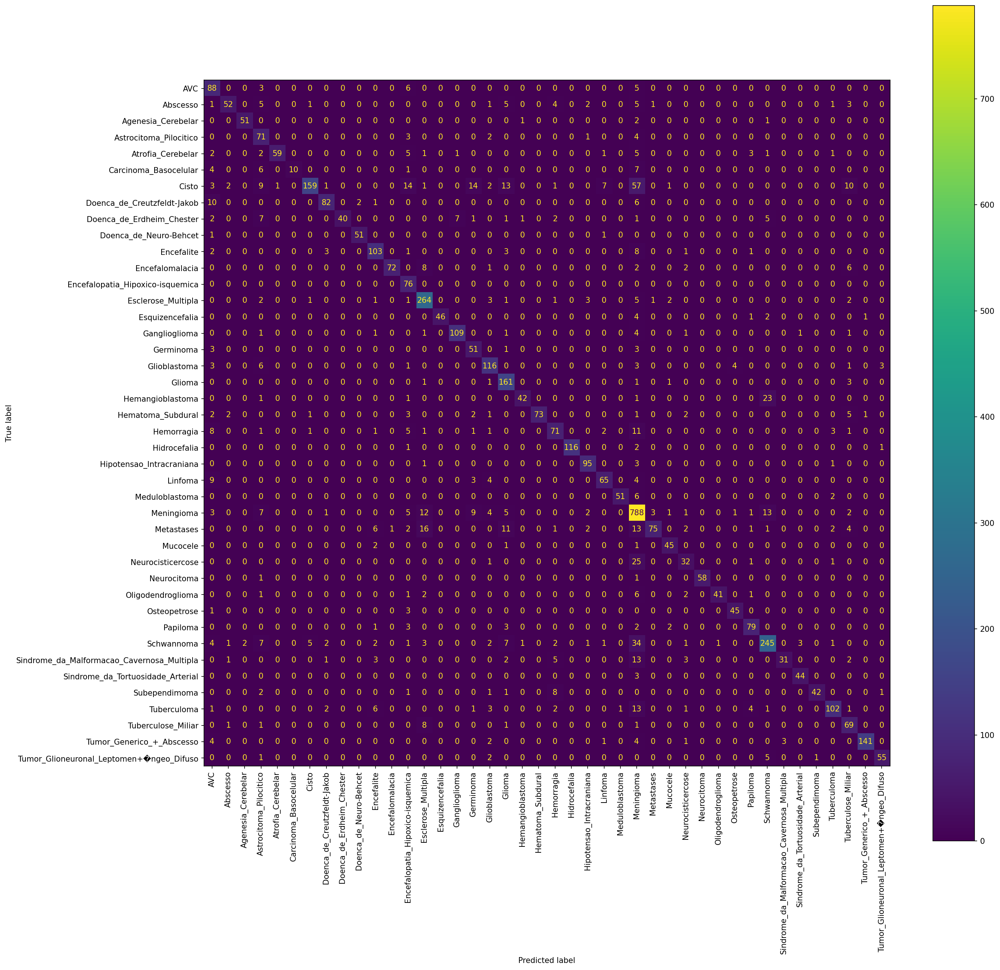

In [53]:
cm = confusion_matrix(y_true=y_test,y_pred=y_predict_knn)
fig, ax = plt.subplots(figsize=(20, 20), dpi=150)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=pos_label)
disp.plot(ax=ax)
plt.xticks(rotation=90)